In [1]:
## Based on best quiz responses; by Rixit and Vedant

In [2]:
import pandas as pd
import numpy as np

In [3]:
url = 'https://raw.githubusercontent.com/biplav-s/course-tai/main/sample-code/common-data/water/WaterAtlas-OneLake.csv'
# Load data into Dataframe and print first 5 rows 
data = pd.read_csv(url)
data.head()

,WBodyID,WaterBodyName,DataSource,StationID,StationName,Actual_StationID,Actual_Latitude,Actual_Longitude,DEP_WBID,SampleDate,...,DepthUnits,Parameter,Characteristic,Sample_Fraction,Result_Value,Result_Unit,QACode,Result_Comment,Original_Result_Value,Original_Result_Unit
0,2003889,Okaloacoochee Branch,WIN_21FLSFWM,32275,CRFW09,32275,26.7629,-81.4001,3235O,5/18/2020 11:11:00 AM,...,m,TN_ugl,Nitrogen,Total,1280.000,ug/l,NaN,NaN,1.280,mg/L
1,2003889,Okaloacoochee Branch,WIN_21FLSFWM,32275,CRFW09,32275,26.7629,-81.4001,3235O,5/18/2020 11:11:00 AM,...,m,NH3_N_ugl,"Nitrogen, ammonia as N",Dissolved,203.000,ug/l,NaN,NaN,0.203,mg/L
2,2003889,Okaloacoochee Branch,WIN_21FLSFWM,32275,CRFW09,32275,26.7629,-81.4001,3235O,5/18/2020 11:11:00 AM,...,m,NOx_ugl,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",Dissolved,9.000,ug/l,I,NaN,0.009,mg/L
3,2003889,Okaloacoochee Branch,WIN_21FLSFWM,32275,CRFW09,32275,26.7629,-81.4001,3235O,5/18/2020 11:11:00 AM,...,m,TP_ugl,Phosphorus as P,Total,52.000,ug/l,NaN,NaN,0.052,mg/L
4,2003889,Okaloacoochee Branch,WIN_21FLSFWM,32275,CRFW09,32275,26.7629,-81.4001,3235O,5/18/2020 11:11:00 AM,...,m,OP_mgl,"Phosphorus, phosphate (PO4) as P",Dissolved,0.002,mg/l,I,NaN,0.002,mg/L


In [4]:
#Verifying data types
data.dtypes

WBodyID                    int64
WaterBodyName             object
DataSource                object
StationID                 object
StationName               object
Actual_StationID          object
Actual_Latitude          float64
Actual_Longitude         float64
DEP_WBID                  object
SampleDate                object
ActivityDepth            float64
DepthUnits                object
Parameter                 object
Characteristic            object
Sample_Fraction           object
Result_Value             float64
Result_Unit               object
QACode                    object
Result_Comment            object
Original_Result_Value    float64
Original_Result_Unit      object
dtype: object

In [6]:
# Datatype for "SampleDate" field is object and date is not formatted so coverting it into single format
pd.set_option('display.max_rows', 105)
data['SampleDate'] = pd.to_datetime(data.SampleDate)
data['SampleDate'] = data['SampleDate'].dt.strftime('%Y-%m-%d %H:%M')
data['SampleDate'].head()

0    2020-05-18 11:11
1    2020-05-18 11:11
2    2020-05-18 11:11
3    2020-05-18 11:11
4    2020-05-18 11:11
Name: SampleDate, dtype: object

In [7]:
# Checking number of rows has null values for various columns in the given data
for column in data.columns:
    print(column,data[column].isnull().sum())

WBodyID 0
WaterBodyName 0
DataSource 0
StationID 0
StationName 0
Actual_StationID 0
Actual_Latitude 0
Actual_Longitude 0
DEP_WBID 0
SampleDate 0
ActivityDepth 0
DepthUnits 0
Parameter 0
Characteristic 0
Sample_Fraction 554
Result_Value 0
Result_Unit 0
QACode 1961
Result_Comment 1984
Original_Result_Value 110
Original_Result_Unit 110


In [8]:
# Data grouped by date field
data.groupby('SampleDate').count()

,WBodyID,WaterBodyName,DataSource,StationID,StationName,Actual_StationID,Actual_Latitude,Actual_Longitude,DEP_WBID,ActivityDepth,DepthUnits,Parameter,Characteristic,Sample_Fraction,Result_Value,Result_Unit,QACode,Result_Comment,Original_Result_Value,Original_Result_Unit
SampleDate,,,,,,,,,,,,,,,,,,,,
1978-01-11 00:00,28,28,28,28,28,28,28,28,28,28,28,28,28,26,28,28,0,2,26,26
1978-01-20 00:00,20,20,20,20,20,20,20,20,20,20,20,20,20,19,20,20,0,1,19,19
1978-02-08 00:00,29,29,29,29,29,29,29,29,29,29,29,29,29,27,29,29,0,2,27,27
1978-03-08 00:00,26,26,26,26,26,26,26,26,26,26,26,26,26,24,26,26,0,2,24,24
1978-04-04 00:00,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,0,0,2,2
1978-04-05 00:00,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,0,0,20,20
1978-04-19 00:00,22,22,22,22,22,22,22,22,22,22,22,22,22,21,22,22,0,1,21,21
1978-05-03 00:00,25,25,25,25,25,25,25,25,25,25,25,25,25,24,25,25,0,1,24,24
1978-05-17 00:00,25,25,25,25,25,25,25,25,25,25,25,25,25,24,25,25,0,1,24,24


In [9]:
# Creating data frame for "SampleDate", "Parameter" and "Original_Result_Value". 
# This helps to create plots for various parameters, its value and measurement date.
uniqueParameters = data['Parameter'].unique()
from collections import OrderedDict
def valuesByDate(x):
    #print(x['Parameter'].unique())
    d = {}
    for index,row in x.iterrows():
        d[row['Parameter']] = row['Original_Result_Value']
    for parameter in uniqueParameters:
        if parameter not in d:
            d[parameter] = np.NaN
    return pd.Series(OrderedDict(sorted(d.items())))


parametersByDate = data.groupby('SampleDate').apply(valuesByDate)

In [10]:
# Seeing some examples
parametersByDate.head()

,24D_ugl,Ag_ugl,Al_ugl,Alk_CaCO3_mgl,As_ugl,BOD5_mgl,B_ugl,Ba_ugl,C_organic_mgl,Ca_diss_mgl,...,TN_ugl,TOC_mgl,TP_ugl,TSS_mgl,TempW_C,TempW_F,Tl_ugl,Turb_ntu,Zn_ugl,pH
SampleDate,,,,,,,,,,,,,,,,,,,,,
1978-01-11 00:00,NaN,NaN,NaN,243.0,NaN,NaN,NaN,NaN,NaN,112.07,...,NaN,NaN,0.025,NaN,16.7,NaN,NaN,NaN,NaN,7.72
1978-01-20 00:00,NaN,NaN,NaN,248.5,NaN,NaN,NaN,NaN,NaN,111.03,...,NaN,NaN,0.027,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1978-02-08 00:00,NaN,NaN,NaN,263.5,NaN,NaN,NaN,NaN,NaN,122.07,...,NaN,NaN,0.019,NaN,15.9,NaN,NaN,NaN,NaN,7.61
1978-03-08 00:00,NaN,NaN,NaN,252.0,NaN,NaN,NaN,NaN,NaN,80.30,...,NaN,NaN,0.017,NaN,25.0,NaN,NaN,NaN,NaN,7.72
1978-04-04 00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
# Review statistics on measured values for various parameters.
parametersByDate.describe().T

,count,mean,std,min,25%,50%,75%,max
24D_ugl,5.0,0.070100,1.287810e-01,0.002,0.0085,0.0160,0.0240,0.3000
Ag_ugl,19.0,0.010000,1.782259e-18,0.010,0.0100,0.0100,0.0100,0.0100
Al_ugl,6.0,28.833333,1.355606e+01,11.000,20.2500,30.0000,34.5000,49.0000
Alk_CaCO3_mgl,34.0,230.823529,3.344260e+01,113.000,205.7500,240.0000,250.0000,289.0000
As_ugl,25.0,2.137200,5.009950e-01,1.410,1.7800,2.0800,2.4300,3.4800
BOD5_mgl,1.0,1.000000,NaN,1.000,1.0000,1.0000,1.0000,1.0000
B_ugl,6.0,72.700000,1.040961e+01,57.900,66.9000,73.1000,78.0250,87.6000
Ba_ugl,6.0,18.466667,1.155278e+00,16.900,17.8500,18.5000,18.8500,20.3000
C_organic_mgl,19.0,15.842105,3.905312e+00,10.000,12.5000,15.0000,17.5000,24.0000
Ca_diss_mgl,32.0,92.675312,1.690904e+01,46.570,82.8075,92.7150,106.4375,122.0700


In [12]:
# Creating another dataframe for simpler viz.
paramaterDateFrame = pd.DataFrame(data, columns = ['SampleDate','Parameter','Original_Result_Value'])
paramaterDateFrame = paramaterDateFrame.sort_values(by=['SampleDate'])
paramaterDateFrame.head()

,SampleDate,Parameter,Original_Result_Value
1380,1978-01-11 00:00,TempW_F,NaN
1365,1978-01-11 00:00,NH3_N_diss_ugl,0.020
1366,1978-01-11 00:00,TKN_ugl,0.440
1367,1978-01-11 00:00,NO3_diss_ugl,0.020
1368,1978-01-11 00:00,NOx_ugl,0.024


/Users/biplavs/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


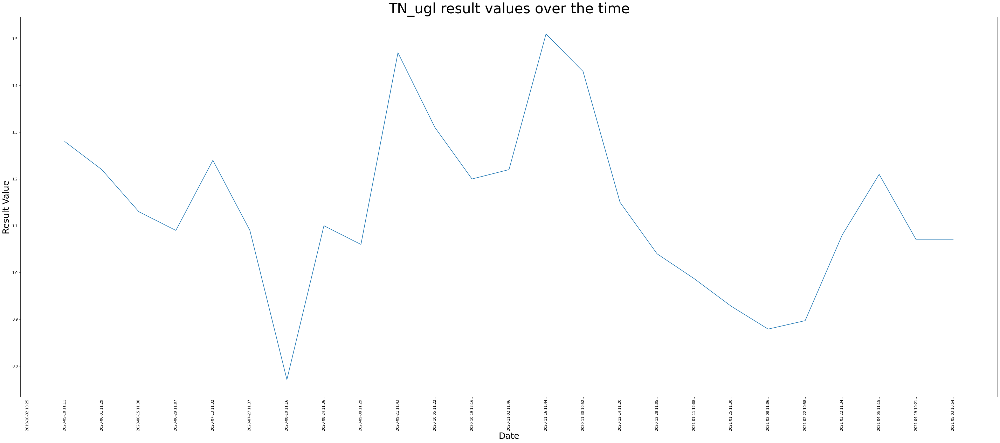

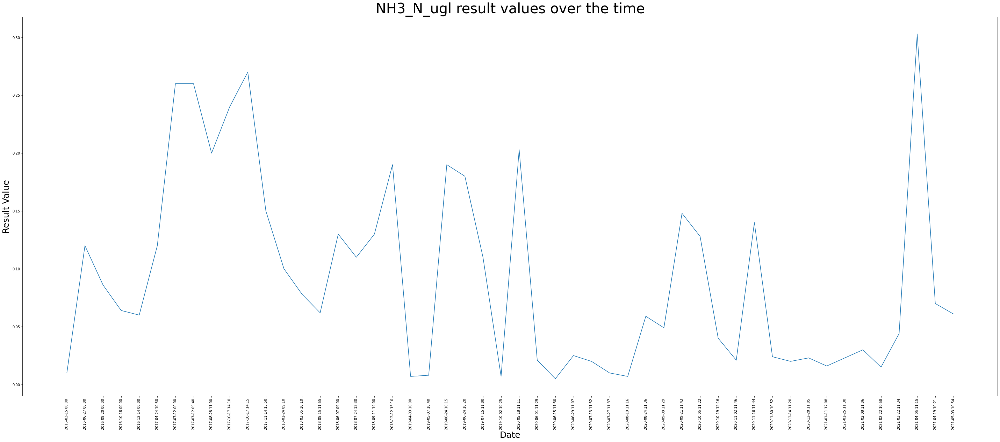

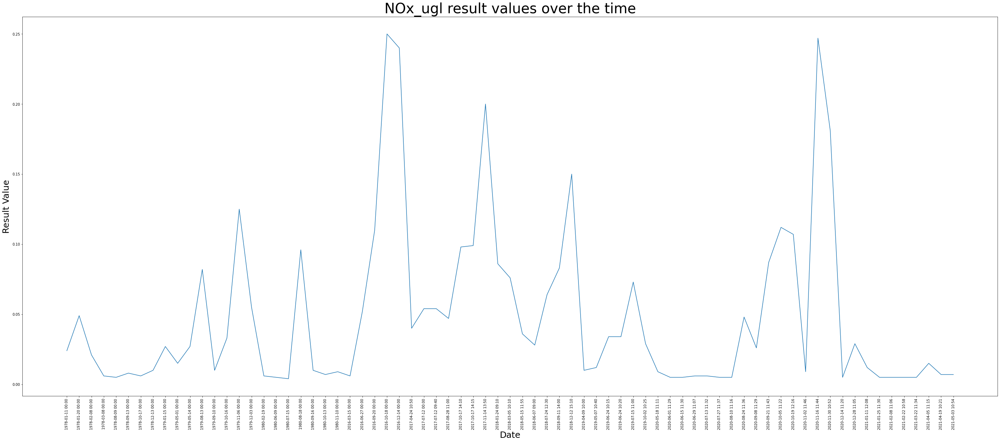

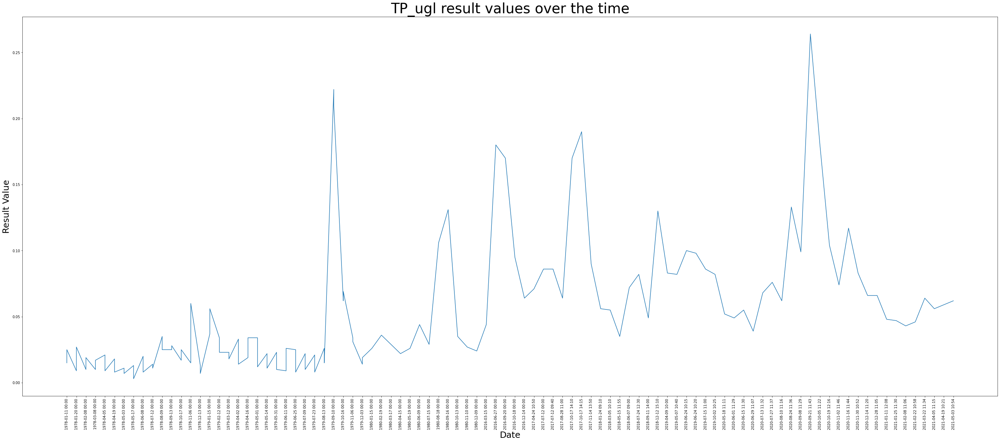

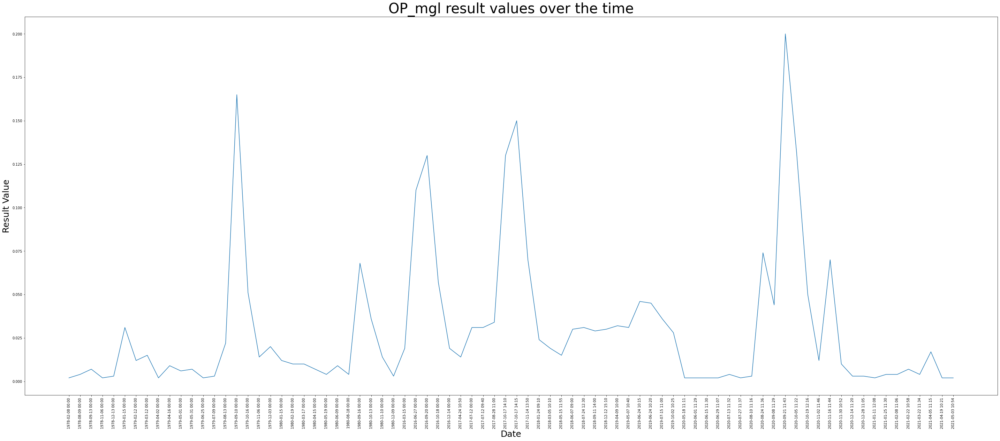

...

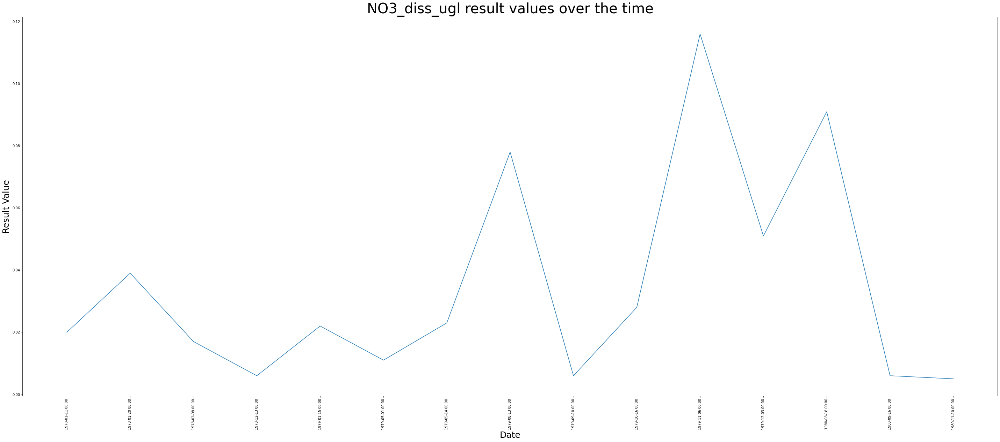

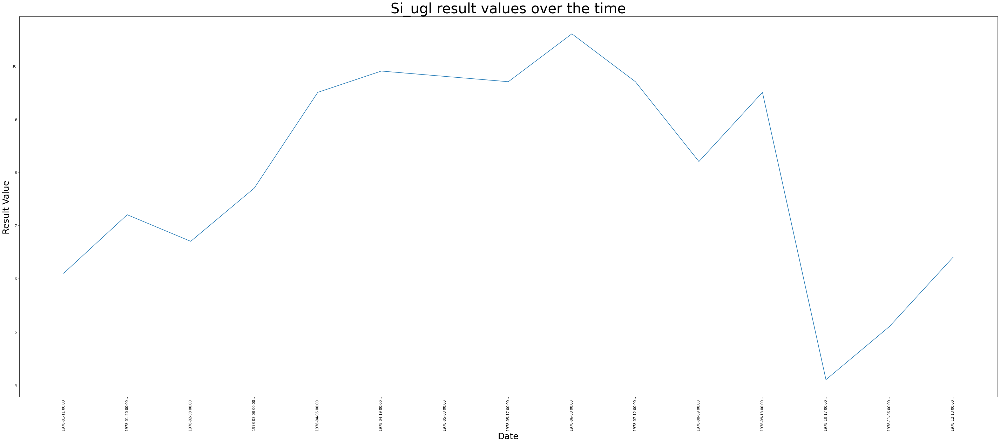

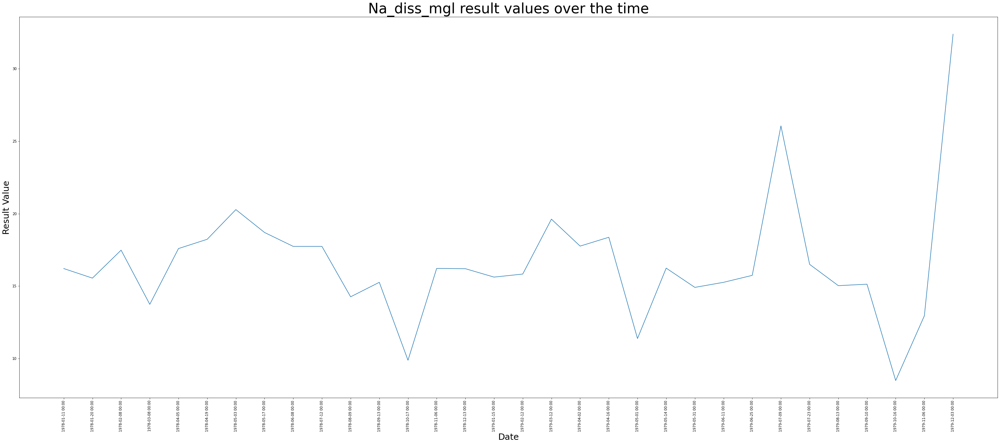

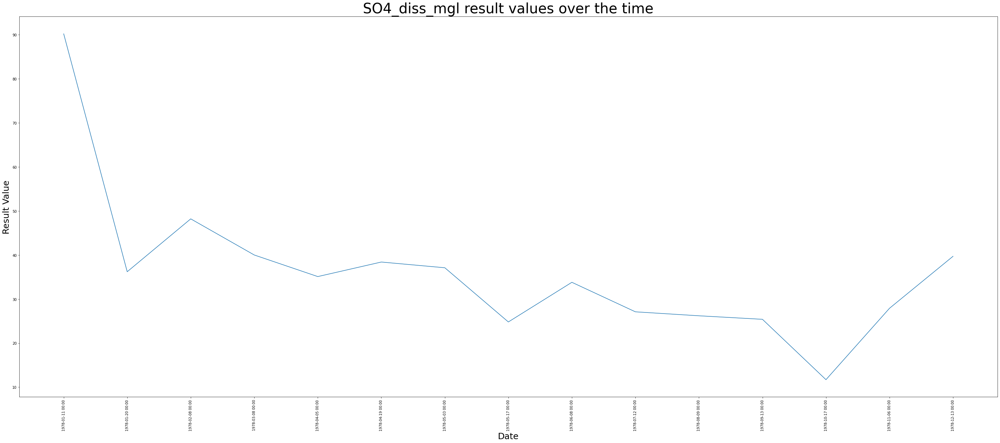

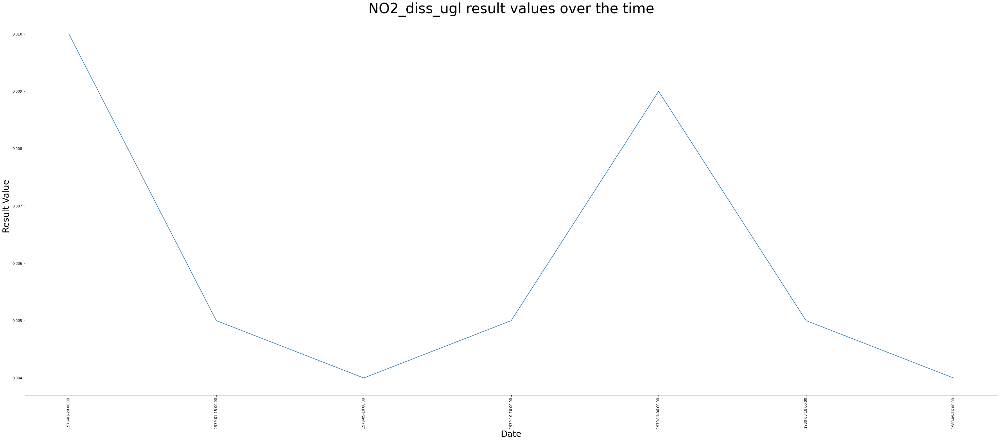

In [13]:
import matplotlib.pyplot as plt

uniqueParameters = data['Parameter'].unique()

for parameter in uniqueParameters:
    subsetDataFrame = paramaterDateFrame[paramaterDateFrame['Parameter'] == parameter]

    x_values = subsetDataFrame['SampleDate']
    y_values = subsetDataFrame['Original_Result_Value']

    fig, ax = plt.subplots(figsize=(50, 20))
    ax = plt.gca()
    plt.plot(x_values, y_values) 
    plt.title(parameter+' result values over the time', fontsize=40)
    plt.xlabel('Date', fontsize=25)
    plt.xticks(rotation=90)
    plt.ylabel('Result Value', fontsize=25)

In [16]:
# Using seaborn to plot the heatmap on the calculated correlation values
import seaborn as sns
import matplotlib.pyplot as plt

In [20]:
# Check corr by parameters in the data
sns.set(rc={'figure.figsize':(15,11)})
corr = parametersByDate.corr()
corr

,24D_ugl,Ag_ugl,Al_ugl,Alk_CaCO3_mgl,As_ugl,BOD5_mgl,B_ugl,Ba_ugl,C_organic_mgl,Ca_diss_mgl,...,TN_ugl,TOC_mgl,TP_ugl,TSS_mgl,TempW_C,TempW_F,Tl_ugl,Turb_ntu,Zn_ugl,pH
24D_ugl,1.000000,NaN,0.788673,-0.503719,-0.617909,NaN,0.045088,0.078651,0.803086,NaN,...,NaN,NaN,-0.059569,0.630434,0.543560,0.543560,NaN,0.244663,NaN,0.322506
Ag_ugl,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Al_ugl,0.788673,NaN,1.000000,0.108282,-0.354840,NaN,0.318184,0.119618,0.730698,NaN,...,NaN,NaN,0.353329,0.129945,0.739983,0.739983,NaN,0.424836,NaN,-0.079176
Alk_CaCO3_mgl,-0.503719,NaN,0.108282,1.000000,0.074341,NaN,0.672950,0.296698,-0.710828,0.877751,...,NaN,NaN,0.027296,0.325170,-0.374505,-0.459704,NaN,0.489365,-0.174534,0.302018
As_ugl,-0.617909,NaN,-0.354840,0.074341,1.000000,NaN,-0.489855,0.317732,-0.079955,NaN,...,NaN,-0.379800,0.222572,0.634120,-0.061865,-0.051180,NaN,0.720630,NaN,0.113010
BOD5_mgl,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
B_ugl,0.045088,NaN,0.318184,0.672950,-0.489855,NaN,1.000000,0.392483,0.641249,NaN,...,NaN,NaN,-0.363929,-0.710735,0.179544,0.179544,NaN,-0.473522,NaN,0.238212
Ba_ugl,0.078651,NaN,0.119618,0.296698,0.317732,NaN,0.392483,1.000000,0.422366,NaN,...,NaN,NaN,0.093989,-0.295426,0.579701,0.579701,NaN,0.190113,NaN,0.320726
C_organic_mgl,0.803086,NaN,0.730698,-0.710828,-0.079955,NaN,0.641249,0.422366,1.000000,NaN,...,NaN,NaN,0.725888,-0.376320,0.487100,0.487100,NaN,-0.517188,NaN,-0.323597
Ca_diss_mgl,NaN,NaN,NaN,0.877751,NaN,NaN,NaN,NaN,NaN,1.000000,...,NaN,NaN,-0.398071,NaN,-0.291314,NaN,NaN,NaN,1.000000,0.288336


<AxesSubplot:>

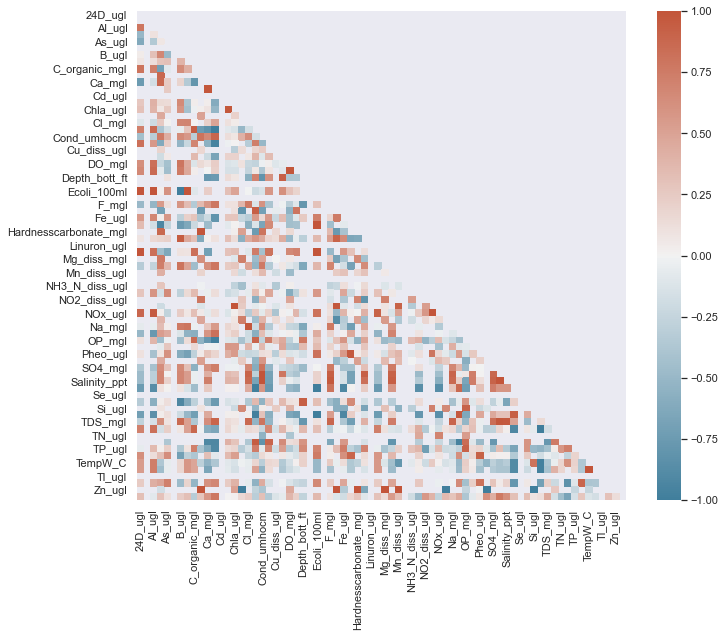

In [21]:

# Creating a triangle heat map, for better interpretation of the values.

mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, square=True)

